# Sentinel-2 on the Planetary Computer

##### https://github.com/Element84/geo-notebooks/blob/main/notebooks/odc-planetary-computer.ipynb

This notebook explores Sentinel-2 data on Microsoft's Planetary Computer using:

* Planetary Computer STAC API, catalog of public data
* Planetary Computer Hub for running Jupyter Notebooks in the cloud
* pystac-client for searching and access data
* OpenDataCube and odc-stac for loading STAC assets and representing geospatial data as XArrays
* XArray, pandas and geopandas for manipulating data
* Dask for performing parallel, distributed computing
* hvplot for visualization
* Shown will be how find data for an area of interest, explore the resulting metadata, perform calculations, and visualize the results.

###### Created by Element 84

# Table of contents
1. [Search for data](#search)
2. [Use GeoPandas to view footprints](#gpd)
3. [OpenDataCube](#odc)
4. [Calculations](#calculations)
5. [Start dask client](#dask)
6. [Compute](#compute)
7. [Shut down cluster](#shutdown)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
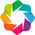

In [2]:
import holoviews as hv
hv.extension('bokeh')

from copy import deepcopy
import geopandas as gpd
import hvplot.pandas
import pandas as pd
import pystac
from shapely.geometry import shape

# create a function for later reuse
def plot_polygons(data, *args, **kwargs):
    return data.hvplot.paths(*args, geo=True, tiles='OSM', xaxis=None, yaxis=None,
                             frame_width=600, frame_height=600,
                             line_width=3, **kwargs)

# convert a list of STAC Items into a GeoDataFrame
def items_to_geodataframe(items):
    _items = []
    for i in items:
        _i = deepcopy(i)
        _i['geometry'] = shape(_i['geometry'])
        _items.append(_i)
    gdf = gpd.GeoDataFrame(pd.json_normalize(_items))
    for field in ['properties.datetime', 'properties.created', 'properties.updated']:
        if field in gdf:
            gdf[field] = pd.to_datetime(gdf[field])
    gdf.set_index('properties.datetime', inplace=True)
    return gdf

# set pystac_client logger to DEBUG to see API calls
import logging
logging.basicConfig()
logger = logging.getLogger('pystac_client')
logger.setLevel(logging.INFO)

## 1. Search for data <a class="anchor" id="search"></a>
Use pystac-client to find data in the Planetary Computer STAC API.

In [3]:
# Open the Planetary Computer STAC API

from pystac_client import Client
URL = 'https://planetarycomputer.microsoft.com/api/stac/v1'
cat = Client.open(URL)
cat

ID: microsoft-pc
Title: Microsoft Planetary Computer STAC API
Description: Searchable spatiotemporal metadata describing Earth science datasets hosted by the Microsoft Planetary Computer
type: Catalog
"conformsTo: ['http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/core', 'http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/geojson', 'http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/oas30', 'https://api.stacspec.org/v1.0.0-rc.1/collections', 'https://api.stacspec.org/v1.0.0-rc.1/core', 'https://api.stacspec.org/v1.0.0-rc.1/item-search', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#fields', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:basic-cql', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:cql-json', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:cql-text', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:filter', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:item-search-filter', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#query', 'https://api.stacspec.org/v1.0.0-rc.1/item-search#sort', 'https://api.stacspec.org/v1.0.0-rc.1/ogcapi-features']"
ID: daymet-annual-pr
Title: Daymet Annual Puerto Rico
"Description: Annual climate summaries derived from [Daymet](https://daymet.ornl.gov) Version 4 daily data at a 1 km x 1 km spatial resolution for five variables: minimum and maximum temperature, precipitation, vapor pressure, and snow water equivalent. Annual averages are provided for minimum and maximum temperature, vapor pressure, and snow water equivalent, and annual totals are provided for the precipitation variable. [Daymet](https://daymet.ornl.gov/) provides measurements of near-surface meteorological conditions; the main purpose is to provide data estimates where no instrumentation exists. The dataset covers the period from January 1, 1980 to the present. Each year is processed individually at the close of a calendar year. Data are in a Lambert conformal conic projection for North America and are distributed in Zarr and NetCDF formats, compliant with the [Climate and Forecast (CF) metadata conventions (version 1.6)](http://cfconventions.org/). Use the DOI at [https://doi.org/10.3334/ORNLDAAC/1852](https://doi.org/10.3334/ORNLDAAC/1852) to cite your usage of the data. This dataset provides coverage for Hawaii; North America and Puerto Rico are provided in [separate datasets](https://planetarycomputer.microsoft.com/dataset/group/daymet#annual)."
"Providers: Microsoft (host, processor) ORNL DAAC (producer)"
type: Collection
title: Daymet Annual Puerto Rico


Fetch the collection of interest: Sentinel-2, Level 2 Surface Reflectance and print the assets that are available.

In [4]:
collection = cat.get_collection('sentinel-2-l2a')

pd.DataFrame.from_dict(collection.to_dict()['item_assets'], orient='index')

,gsd,type,roles,title,eo:bands
AOT,10.0,image/tiff; application=geotiff; profile=cloud...,[data],Aerosol optical thickness (AOT),NaN
B01,60.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 1 - Coastal aerosol - 60m,"[{'name': 'B01', 'common_name': 'coastal', 'de..."
B02,10.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 2 - Blue - 10m,"[{'name': 'B02', 'common_name': 'blue', 'descr..."
B03,10.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 3 - Green - 10m,"[{'name': 'B03', 'common_name': 'green', 'desc..."
B04,10.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 4 - Red - 10m,"[{'name': 'B04', 'common_name': 'red', 'descri..."
B05,20.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 5 - Vegetation red edge 1 - 20m,"[{'name': 'B05', 'common_name': 'rededge', 'de..."
B06,20.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 6 - Vegetation red edge 2 - 20m,"[{'name': 'B06', 'common_name': 'rededge', 'de..."
B07,20.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 7 - Vegetation red edge 3 - 20m,"[{'name': 'B07', 'common_name': 'rededge', 'de..."
B08,10.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 8 - NIR - 10m,"[{'name': 'B08', 'common_name': 'nir', 'descri..."
B09,60.0,image/tiff; application=geotiff; profile=cloud...,[data],Band 9 - Water vapor - 60m,"[{'name': 'B09', 'description': 'Band 9 - Wate..."


Define the **AOI** and the search parameters here. AOI is fetched with a geojson file.

In [28]:
import geopandas as gpd
import json

aoi = gpd.read_file('test_aoi.geojson')
geom = aoi['geometry'][0] # < shapely geometry object

# limit sets the # of items per page so we can see multiple pages getting fetched
search = cat.search(
    collections = ["sentinel-2-l2a"],
    intersects = geom,
    datetime = "2019-01-01/2020-01-01",
    query = ["eo:cloud_cover<10"],
    limit = 100
)

## 2. Use GeoPandas to view footprints <a class="anchor" id="gpd"></a>
The cell below fetches all the STAC Items, then creates a GeoDataFrame for visualizing the footprints.

In [29]:
# Get all items as a dictionary
items_dict = search.get_all_items_as_dict()['features']

# Create GeoDataFrame from Items
items_gdf = items_to_geodataframe(items_dict)

print(f"{len(items_dict)} items found")

items_gdf.head()

60 items found


,id,bbox,type,links,geometry,collection,stac_extensions,stac_version,assets.AOT.href,assets.AOT.proj:bbox,...,properties.s2:cloud_shadow_percentage,properties.s2:nodata_pixel_percentage,properties.s2:unclassified_percentage,properties.s2:dark_features_percentage,properties.s2:not_vegetated_percentage,properties.s2:degraded_msi_data_percentage,properties.s2:high_proba_clouds_percentage,properties.s2:reflectance_conversion_factor,properties.s2:medium_proba_clouds_percentage,properties.s2:saturated_defective_pixel_percentage
properties.datetime,,,,,,,,,,,,,,,,,,,,,
2019-12-17 09:13:09.024000+00:00,S2B_MSIL2A_20191217T091309_R050_T35SKC_2020100...,"[23.545497035913204, 37.81010790673744, 24.838...",Feature,"[{'rel': 'collection', 'type': 'application/js...","POLYGON ((23.54550 38.79789, 24.80865 38.82844...",sentinel-2-l2a,[https://stac-extensions.github.io/eo/v1.0.0/s...,1.0.0,https://sentinel2l2a01.blob.core.windows.net/s...,"[199980.0, 4190220.0, 309780.0, 4300020.0]",...,2.342205,0.0,3.021284,3.406422,6.828842,0.0,2.317550,1.032004,1.145341,0.0
2019-12-17 09:13:09.024000+00:00,S2B_MSIL2A_20191217T091309_R050_T34SGH_2020100...,"[23.272364192599564, 37.80685703267152, 24.566...",Feature,"[{'rel': 'collection', 'type': 'application/js...","POLYGON ((23.30347 38.82628, 24.56645 38.79453...",sentinel-2-l2a,[https://stac-extensions.github.io/eo/v1.0.0/s...,1.0.0,https://sentinel2l2a01.blob.core.windows.net/s...,"[699960.0, 4190220.0, 809760.0, 4300020.0]",...,2.682171,0.0,3.968298,4.139973,8.394700,0.0,6.187017,1.032004,1.993149,0.0
2019-11-22 09:13:11.024000+00:00,S2A_MSIL2A_20191122T091311_R050_T35SKC_2020100...,"[23.545497035913204, 37.81010790673744, 24.838...",Feature,"[{'rel': 'collection', 'type': 'application/js...","POLYGON ((23.54550 38.79789, 24.80865 38.82844...",sentinel-2-l2a,[https://stac-extensions.github.io/eo/v1.0.0/s...,1.0.0,https://sentinel2l2a01.blob.core.windows.net/s...,"[199980.0, 4190220.0, 309780.0, 4300020.0]",...,3.409063,0.0,3.341432,2.746819,8.872850,0.0,2.396336,1.023851,1.036649,0.0
2019-11-22 09:13:11.024000+00:00,S2A_MSIL2A_20191122T091311_R050_T34SGH_2020100...,"[23.272364192599564, 37.80685703267152, 24.566...",Feature,"[{'rel': 'collection', 'type': 'application/js...","POLYGON ((23.30347 38.82628, 24.56645 38.79453...",sentinel-2-l2a,[https://stac-extensions.github.io/eo/v1.0.0/s...,1.0.0,https://sentinel2l2a01.blob.core.windows.net/s...,"[699960.0, 4190220.0, 809760.0, 4300020.0]",...,4.338642,0.0,4.469142,3.545755,11.913355,0.0,2.442480,1.023851,1.158258,0.0
2019-11-02 09:11:31.024000+00:00,S2A_MSIL2A_20191102T091131_R050_T35SKC_2020100...,"[23.545497035913204, 37.81010790673744, 24.838...",Feature,"[{'rel': 'collection', 'type': 'application/js...","POLYGON ((23.54550 38.79789, 24.80865 38.82844...",sentinel-2-l2a,[https://stac-extensions.github.io/eo/v1.0.0/s...,1.0.0,https://sentinel2l2a01.blob.core.windows.net/s...,"[199980.0, 4190220.0, 309780.0, 4300020.0]",...,2.204648,0.0,2.607904,1.625230,15.708356,0.0,2.258450,1.014152,0.966569,0.0


In [7]:
plot_polygons(aoi) * items_gdf.hvplot.paths(geo=True)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]
   .Path.II :Path   [Longitude,Latitude]

## 3. OpenDataCube <a class="anchor" id="odc"></a>
Now we'll turn the set of scenes into a virtual datacube. None of the data will actually be read yet.

The configuration string (cfg) is for providing additional info not currently available in the STAC Items, but will be in the future.

In [30]:
import yaml

cfg = """---
sentinel-2-l2a:
  assets:
    '*':
      data_type: uint16
      nodata: 0
      unit: '1'
"""
cfg = yaml.load(cfg, Loader=yaml.CSafeLoader)

Here we load as a DataCube. A PySTAC ItemCollection is created from the found STAC Items, and we specify various parameters, such as bands of interest and chunk size. We are requesting to only load pixels within a bounding box of the requested geometry (bbox=geom.bounds).

In [31]:
%%time

from odc.stac import stac_load
import planetary_computer as pc

# Create PySTAC ItemCollection
item_collection = pystac.ItemCollection(items_dict)

dc = stac_load(item_collection,
               measurements=['B02', 'B03', 'B04', 'B08'],
               chunks={"x": 2048, "y": 2048},
               bbox=geom.bounds,
               stac_cfg=cfg,
               patch_url=pc.sign
)
dc

CPU times: total: 1.94 s
Wall time: 1.98 s


<xarray.Dataset>
Dimensions:      (y: 417, x: 631, time: 33)
Coordinates:
  * y            (y) float64 4.209e+06 4.209e+06 ... 4.205e+06 4.205e+06
  * x            (x) float64 7.362e+05 7.362e+05 ... 7.425e+05 7.425e+05
    spatial_ref  int32 32634
  * time         (time) datetime64[ns] 2019-01-06T09:13:51.024000 ... 2019-12...
Data variables:
    B02          (time, y, x) uint16 dask.array<chunksize=(1, 417, 631), meta=np.ndarray>
    B03          (time, y, x) uint16 dask.array<chunksize=(1, 417, 631), meta=np.ndarray>
    B04          (time, y, x) uint16 dask.array<chunksize=(1, 417, 631), meta=np.ndarray>
    B08          (time, y, x) uint16 dask.array<chunksize=(1, 417, 631), meta=np.ndarray>

## 4. Calculations <a class="anchor" id="calculations"></a>
We will create an RGBA datacube representation (nodata values have alpha=0), and generate an NDVI datacube.

In [32]:
from odc.algo import to_rgba

RGB = ['B04', 'B03', 'B02']
vis = to_rgba(dc, clamp=(1, 3000), bands=RGB)
vis

<xarray.DataArray 'ro_rgba-e8805082-58ec9b1a4aea64cd24a77f622f047db0' (
                                                                       time: 33,
                                                                       y: 417,
                                                                       x: 631,
                                                                       band: 4)>
dask.array<ro_rgba-e8805082, shape=(33, 417, 631, 4), dtype=uint8, chunksize=(1, 417, 631, 4), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 4.209e+06 4.209e+06 ... 4.205e+06 4.205e+06
  * x            (x) float64 7.362e+05 7.362e+05 ... 7.425e+05 7.425e+05
    spatial_ref  int32 32634
  * time         (time) datetime64[ns] 2019-01-06T09:13:51.024000 ... 2019-12...
  * band         (band) <U1 'r' 'g' 'b' 'a'
Attributes:
    crs:      EPSG:32634

In [33]:
ndvi = ((dc['B08'] - dc['B04']) / (dc['B08'] + dc['B04'])).clip(0, 1).rename("ndvi")
ndvi

<xarray.DataArray 'ndvi' (time: 33, y: 417, x: 631)>
dask.array<clip, shape=(33, 417, 631), dtype=float64, chunksize=(1, 417, 631), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 4.209e+06 4.209e+06 ... 4.205e+06 4.205e+06
  * x            (x) float64 7.362e+05 7.362e+05 ... 7.425e+05 7.425e+05
    spatial_ref  int32 32634
  * time         (time) datetime64[ns] 2019-01-06T09:13:51.024000 ... 2019-12...

## 5. Start Dask Client <a class="anchor" id="dask"></a>
Start a local Dask cluster.

In [34]:
from dask.distributed import Client
client = Client()
client

c:\Users\Kostas\anaconda3\envs\stac\lib\site-packages\distributed\node.py:183: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 50401 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:50401/status,
Dashboard: http://127.0.0.1:50401/status,Workers: 4
Total threads: 8,Total memory: 13.95 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:50402,Workers: 4
Dashboard: http://127.0.0.1:50401/status,Total threads: 8
Started: Just now,Total memory: 13.95 GiB
Comm: tcp://127.0.0.1:50441,Total threads: 2
Dashboard: http://127.0.0.1:50442/status,Memory: 3.49 GiB
Nanny: tcp://127.0.0.1:50406,


## 6. Compute <a class="anchor" id="compute"></a>
Now, we kick off our Dask computation by using the Dask persist function, which will keep the data in memory on the cluster for faster access later.

The Dask compute function is used when we actually want the data, such as displaying it.

The persist function takes a while depending on the amount of data to be loaded

In [35]:
%%time
from dask.distributed import wait

ndvi, vis = client.persist([ndvi, vis])
_ = wait([ndvi, vis])

c:\Users\Kostas\anaconda3\envs\stac\lib\statistics.py:190: RuntimeWarning: overflow encountered in long_scalars
  partials[d] = partials_get(d, 0) + n


CPU times: total: 2min 46s
Wall time: 10min 5s


CPU times: total: 24.7 s
Wall time: 26 s


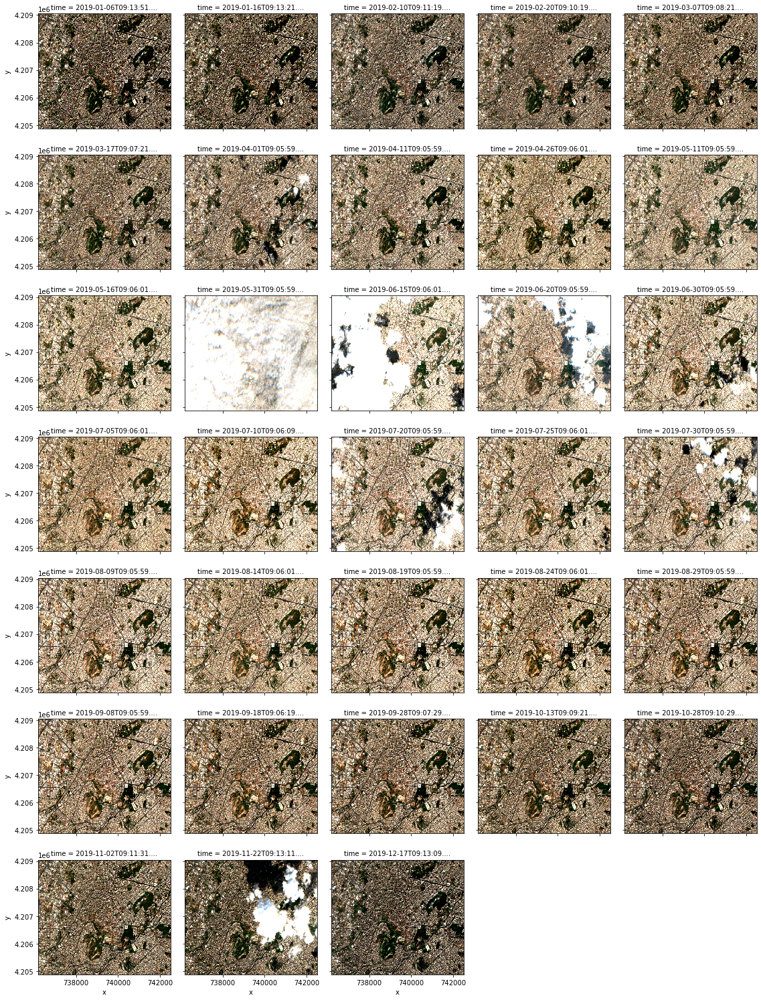

In [36]:
%%time
vis_ = vis.compute()
vis_.plot.imshow(col='time', rgb='band', col_wrap=5, robust=True)

In [37]:
import hvplot.xarray

hvplot_kwargs = {
    "frame_width": 800,
    "xaxis": None,
    "yaxis": None,
    "widget_location": "bottom",
    "aspect": len(vis.x)/len(vis.y)
}

vis_.hvplot.rgb('x', 'y', bands='band', groupby='time', **hvplot_kwargs)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2019-01-06 ...]), value=numpy.datetime64('2019-01-..., width=250)
        [2] HSpacer()

In [38]:
ndvi_ = ndvi.compute()
ndvi_.hvplot('x', 'y', groupby='time', **hvplot_kwargs)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2019-01-06 ...]), value=numpy.datetime64('2019-01-..., width=250)
        [2] HSpacer()

Create an animated GIF of NDVI over time using geogif with the fetched results.

CPU times: total: 2.81 s
Wall time: 2.3 s


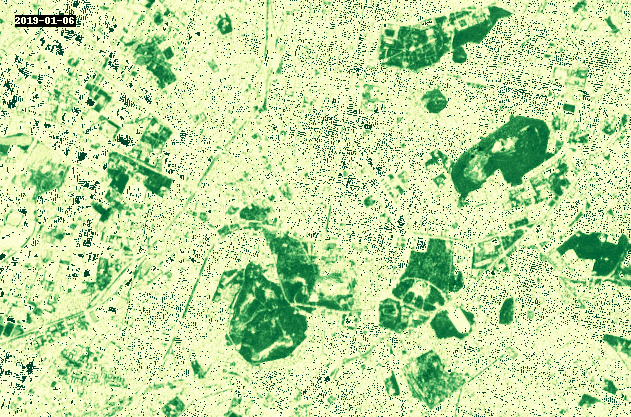

In [39]:
%%time
from geogif import gif, dgif

gif(ndvi_, fps=5, cmap='YlGn')

In [40]:
%%time
ndvi_mean = ndvi.mean(dim=['x', 'y']).compute()
ndvi_mean.hvplot()

CPU times: total: 375 ms
Wall time: 350 ms


:Curve   [time]   (ndvi)

## 7. Shutdown cluster <a class="anchor" id="shutdown"></a>

In [42]:
if "cluster" in locals():
    cluster.close()